## Setup

### Configuration

In [41]:
import sys
import torch
from google.colab import drive, files

drive.mount('/content/drive')

# Set directories
PROJECT_DIR = "/content/drive/MyDrive/ods-demo"
SRC_DIR = f"{PROJECT_DIR}/src"
DATA_DIR = f"{PROJECT_DIR}/data"
RESULTS_DIR = f"{PROJECT_DIR}/results/algorithms/numerical"

# Add the src directory to the Python path
sys.path.append(SRC_DIR)

# Choose device
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f"Device: {device}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Device: cpu


### Libraries

In [ ]:
!pip install kaleido # In Colab, might need to restart the session for kaleido to work
import json

# Custom
import algorithms as al
import utils as ut

## Toy Dataset

### Generate Data

In [ ]:
# All labeled
X_l_toy0, y_l_toy0, X_u_toy0, y_u_toy0 = ut.generate_data(n=10000,
                                                      n_features=3,
                                                      std=1.8,
                                                      centers=[[-3,3,2],[3,-3,-2]],
                                                      proportion_labeled=1.0,
                                                      normalize=True)

In [ ]:
ut.plot_3d_data(X_l_toy0, y_l_toy0, X_u_toy0,
                title='Interactive 3D Scatterplot of Original Labeled Data',
                x_lab='X1 (std)',
                y_lab='X2 (std)',
                z_lab='X3 (std)')

In [17]:
# Labeled and unlabeled
X_l_toy, y_l_toy, X_u_toy, y_u_toy = ut.generate_data(n=10000,
                                                      n_features=3,
                                                      std=1.8,
                                                      centers=[[-3,3,2],[3,-3,-2]],
                                                      proportion_labeled=0.1,
                                                      normalize=True)

In [18]:
ut.plot_3d_data(X_l_toy, y_l_toy, X_u_toy,
                title='Interactive 3D Scatterplot of Labeled and Unlabeled Data',
                x_lab='X1 (std)',
                y_lab='X2 (std)',
                z_lab='X3 (std)')

### Generate Matrices

In [19]:
# Compute inverse pairwise euclidean distances
W_toy = ut.similarity_matrix(X_l_toy, X_u_toy, normalize_rows=True)
W_bar_toy = ut.similarity_matrix(X_u_toy, X_u_toy, normalize_rows=True, ensure_symmetry=True)

In [20]:
# Check shapes
print(f"X_l_toy shape: {X_l_toy.shape}")
print(f"y_l_toy shape: {y_l_toy.shape}")
print(f"X_u_toy shape: {X_u_toy.shape}")
print(f"y_u_toy shape: {y_u_toy.shape}")
print(f"W_toy shape: {W_toy.shape}")
print(f"W_bar_toy shape: {W_bar_toy.shape}")

X_l_toy shape: (1000, 3)
y_l_toy shape: (1000,)
X_u_toy shape: (9000, 3)
y_u_toy shape: (9000,)
W_toy shape: (1000, 9000)
W_bar_toy shape: (9000, 9000)


### Lipschitz Constant

In [21]:
L_toy, alpha_toy = ut.lipschitz(W_toy, W_bar_toy)
print(f"Estimated Lipschitz constant L = {L_toy:.4f}")
print(f"Alpha = {alpha_toy:.6f}")

Estimated Lipschitz constant L = 0.3147
Alpha = 3.177784


### Gradient Descent

In [23]:
gd_res_toy = al.gradient_descent(y_l_toy, W_toy, W_bar_toy, y_u_toy,
                                  alpha=alpha_toy,
                                  accuracy_threshold=99.0)

Iter   0: loss = 808.8336, ||grad|| = 16.6762, alpha = 3.177784, accuracy = 92.511%
Stopped early: accuracy >= 99.0%
Best accuracy: 99.156% at iteration 3.
Iter 3: loss = 770.995, ||grad|| = 1.317
Total CPU time: 3.0126 seconds.


### Gauss-Southwell BCGD (1-D Blocks)

#### Non-cached

In [24]:
bcgd_1_d_non_cached_res_toy = al.bcgd_gs(y_l_toy, W_toy, W_bar_toy, y_u_toy,
                                         alpha=alpha_toy,
                                         block_size=1,
                                         cache_gradient=False,
                                         accuracy_threshold=99.0)

Iter   0: loss = 1347.4456, ||grad|| = 16.6762, alpha = 3.177784, accuracy = 50.411%
Iter  10: loss = 1343.8501, ||grad|| = 16.6123, alpha = 3.177784, accuracy = 50.522%
Iter  20: loss = 1340.3895, ||grad|| = 16.5519, alpha = 3.177784, accuracy = 50.633%
Iter  30: loss = 1336.9791, ||grad|| = 16.4930, alpha = 3.177784, accuracy = 50.744%
Iter  40: loss = 1333.6477, ||grad|| = 16.4356, alpha = 3.177784, accuracy = 50.856%
Iter  50: loss = 1330.4435, ||grad|| = 16.3796, alpha = 3.177784, accuracy = 50.967%
Iter  60: loss = 1327.3114, ||grad|| = 16.3256, alpha = 3.177784, accuracy = 51.078%
Iter  70: loss = 1324.2639, ||grad|| = 16.2729, alpha = 3.177784, accuracy = 51.189%
Iter  80: loss = 1321.2795, ||grad|| = 16.2209, alpha = 3.177784, accuracy = 51.300%
Iter  90: loss = 1318.3390, ||grad|| = 16.1702, alpha = 3.177784, accuracy = 51.411%
Iter 100: loss = 1315.4359, ||grad|| = 16.1201, alpha = 3.177784, accuracy = 51.522%
Iter 110: loss = 1312.6105, ||grad|| = 16.0705, alpha = 3.177784,

#### Cached

In [56]:
bcgd_1_d_cached_res_toy = al.bcgd_gs(y_l_toy, W_toy, W_bar_toy, y_u_toy,
                                     alpha=alpha_toy,
                                     block_size=1,
                                     cache_gradient=True,
                                     accuracy_threshold=99.0)

Iter   0: loss = 1347.4491, ||grad|| = 16.6753, alpha = 3.177784, accuracy = 50.411%
Iter  10: loss = 1343.8884, ||grad|| = 16.6676, alpha = 3.177784, accuracy = 50.522%
Iter  20: loss = 1340.8023, ||grad|| = 16.6549, alpha = 3.177784, accuracy = 50.622%
Iter  30: loss = 1337.4325, ||grad|| = 16.6477, alpha = 3.177784, accuracy = 50.733%
Iter  40: loss = 1335.0889, ||grad|| = 16.6253, alpha = 3.177784, accuracy = 50.811%
Iter  50: loss = 1332.1980, ||grad|| = 16.6137, alpha = 3.177784, accuracy = 50.911%
Iter  60: loss = 1330.5983, ||grad|| = 16.5831, alpha = 3.177784, accuracy = 50.967%
Iter  70: loss = 1328.7436, ||grad|| = 16.5577, alpha = 3.177784, accuracy = 51.033%
Iter  80: loss = 1327.4573, ||grad|| = 16.5234, alpha = 3.177784, accuracy = 51.078%
Iter  90: loss = 1325.6166, ||grad|| = 16.4989, alpha = 3.177784, accuracy = 51.144%
Iter 100: loss = 1324.3854, ||grad|| = 16.4656, alpha = 3.177784, accuracy = 51.189%
Iter 110: loss = 1322.3246, ||grad|| = 16.4460, alpha = 3.177784,

### Save Results

Necessary for plots:

In [66]:
results_toy = ut.structure_results(gd_res_toy=gd_res_toy,
                                   bcgd_1_d_non_cached_res_toy=bcgd_1_d_non_cached_res_toy,
                                   bcgd_1_d_cached_res_toy=bcgd_1_d_cached_res_toy)

If you want to save the results to a JSON file, run:

In [60]:
# Save the dictionary to a file
results_toy_converted = {key: {k: ut.convert_ndarray_to_list(v) for k, v in inner_dict.items()} for key, inner_dict in results_toy.items()}
with open('results_toy.json', 'w') as f:
    json.dump(results_toy_converted, f)

### Algorithm Comparison

If you want to import previous results stored in a JSON file, run:

In [68]:
# Load the results dictionary
with open(f'{RESULTS_DIR}/results_toy.json', 'r') as f:
    loaded_data_toy = json.load(f)
results_toy = {key: {k: ut.convert_list_to_ndarray(v) for k, v in inner_dict.items()} for key, inner_dict in loaded_data_toy.items()}

#### Decision Boundary

All plots are interactive.

In [70]:
# Gradient descent
ut.plot_decision_boundary_3d(X_l_toy, X_u_toy, y_l_toy, y_u_toy, results_toy['gd_res_toy']['y_pred'], title="Interactive Plot: Gradient Descent Decision Boundary (Toy Dataset)")

In [71]:
# BCGD non-cached
ut.plot_decision_boundary_3d(X_l_toy, X_u_toy, y_l_toy, y_u_toy, results_toy['bcgd_1_d_non_cached_res_toy']['y_pred'], title="Interactive Plot: BCGD 1-D (non-cached) Decision Boundary (Toy Dataset)")

In [72]:
# BCGD cached
ut.plot_decision_boundary_3d(X_l_toy, X_u_toy, y_l_toy, y_u_toy, results_toy['bcgd_1_d_cached_res_toy']['y_pred'], title="Interactive Plot: BCGD 1-D (cached) Decision Boundary (Toy Dataset)")

#### Accuracy, Loss, CPU Time

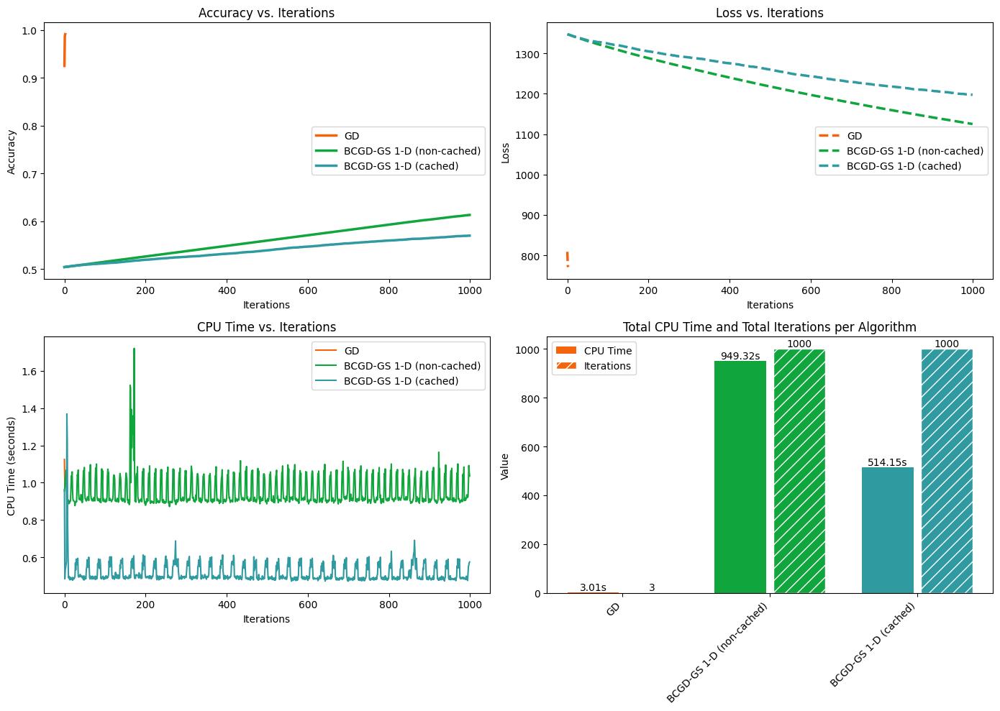

In [69]:
ut.plot_algorithm_comparison(results_toy, toy=True)

## Publicly Available Dataset

### Import Data

In [4]:
features=['Area', 'Eccentricity', 'MinorAxisLength']
labels=['Class']

In [7]:
data = ut.import_data(DATA_DIR, features=features, labels=labels, preprocess=True)
X_l0, y_l0, X_u0, y_u0 = ut.labeled_unlabeled_split(data, features=features, labels=labels, n_labeled=10000)

In [8]:
ut.plot_3d_data(X_l0, y_l0, X_u0,
                title='Interactive 3D Scatterplot of Original Labeled Data',
                x_lab=f'{features[0]} (std)',
                y_lab=f'{features[1]} (std)',
                z_lab=f'{features[2]} (std)')

In [5]:
data = ut.import_data(DATA_DIR, features=features, labels=labels, preprocess=True)
X_l, y_l, X_u, y_u = ut.labeled_unlabeled_split(data, features=features, labels=labels, n_labeled=1000)

In [10]:
ut.plot_3d_data(X_l, y_l, X_u,
                title='Interactive 3D Scatterplot of Labeled and Unlabeled Data',
                x_lab=f'{features[0]} (std)',
                y_lab=f'{features[1]} (std)',
                z_lab=f'{features[2]} (std)')

### Generate Matrices

In [6]:
# Compute inverse pairwise euclidean distances
W = ut.similarity_matrix(X_l, X_u, normalize_rows=True)
W_bar = ut.similarity_matrix(X_u, X_u, normalize_rows=True, ensure_symmetry=True)

In [12]:
# Check shapes
print(f"X_l shape: {X_l.shape}")
print(f"y_l shape: {y_l.shape}")
print(f"X_u shape: {X_u.shape}")
print(f"y_u shape: {y_u.shape}")
print(f"W shape: {W.shape}")
print(f"W_bar shape: {W_bar.shape}")

X_l shape: (1000, 3)
y_l shape: (1000,)
X_u shape: (9000, 3)
y_u shape: (9000,)
W shape: (1000, 9000)
W_bar shape: (9000, 9000)


### Lipschitz Constant

In [13]:
L, alpha = ut.lipschitz(W, W_bar)
print(f"Estimated Lipschitz constant L = {L:.4f}")
print(f"Safe fixed step size alpha = {alpha:.6f}")

Estimated Lipschitz constant L = 0.4480
Safe fixed step size alpha = 2.232145


### Gradient Descent

In [14]:
gd_res = al.gradient_descent(y_l, W, W_bar, y_u,
                             alpha=alpha,
                             accuracy_threshold=99.0)

Iter   0: loss = 769.1119, ||grad|| = 19.3557, alpha = 2.232145, accuracy = 83.878%
Iter  10: loss = 617.0363, ||grad|| = 0.1276, alpha = 2.232145, accuracy = 98.222%
Iter  20: loss = 616.9726, ||grad|| = 0.0217, alpha = 2.232145, accuracy = 98.356%
Iter  30: loss = 616.9696, ||grad|| = 0.0062, alpha = 2.232145, accuracy = 98.344%
Stopped early: accuracy decreased or stayed the same for 20 iterations.
Best accuracy: 98.378% at iteration 16.
Iter 16: loss = 616.982, ||grad|| = 0.047
Total CPU time: 39.3222 seconds.


### Gauss-Southwell BCGD

#### 1-D Blocks

##### Non-cached

In [162]:
bcgd_1_d_non_cached_res = al.bcgd_gs(y_l, W, W_bar, y_u,
                                     alpha=alpha,
                                     block_size=1,
                                     cache_gradient=False,
                                     accuracy_threshold=99.0)

Iter   0: loss = 1364.5586, ||grad|| = 19.3557, alpha = 2.232145, accuracy = 49.733%
Iter  10: loss = 1360.7867, ||grad|| = 19.2960, alpha = 2.232145, accuracy = 49.844%
Iter  20: loss = 1357.2317, ||grad|| = 19.2405, alpha = 2.232145, accuracy = 49.956%
Iter  30: loss = 1353.7221, ||grad|| = 19.1866, alpha = 2.232145, accuracy = 50.067%
Iter  40: loss = 1350.3431, ||grad|| = 19.1334, alpha = 2.232145, accuracy = 50.178%
Iter  50: loss = 1346.9167, ||grad|| = 19.0805, alpha = 2.232145, accuracy = 50.289%
Iter  60: loss = 1343.5098, ||grad|| = 19.0287, alpha = 2.232145, accuracy = 50.400%
Iter  70: loss = 1340.1865, ||grad|| = 18.9773, alpha = 2.232145, accuracy = 50.511%
Iter  80: loss = 1336.8738, ||grad|| = 18.9265, alpha = 2.232145, accuracy = 50.622%
Iter  90: loss = 1333.6273, ||grad|| = 18.8768, alpha = 2.232145, accuracy = 50.733%
Iter 100: loss = 1330.4262, ||grad|| = 18.8275, alpha = 2.232145, accuracy = 50.844%
Iter 110: loss = 1327.2749, ||grad|| = 18.7784, alpha = 2.232145,

##### Cached

In [130]:
bcgd_1_d_cached_res = al.bcgd_gs(y_l, W, W_bar, y_u,
                                 alpha=alpha,
                                 block_size=1,
                                 cache_gradient=True,
                                 accuracy_threshold=99.0)

Iter   0: loss = 1364.5768, ||grad|| = 19.3544, alpha = 2.232145, accuracy = 49.733%
Iter  10: loss = 1360.9935, ||grad|| = 19.3422, alpha = 2.232145, accuracy = 49.844%
Iter  20: loss = 1357.6216, ||grad|| = 19.3303, alpha = 2.232145, accuracy = 49.956%
Iter  30: loss = 1354.5790, ||grad|| = 19.3149, alpha = 2.232145, accuracy = 50.044%
Iter  40: loss = 1351.2913, ||grad|| = 19.3036, alpha = 2.232145, accuracy = 50.133%
Iter  50: loss = 1348.1048, ||grad|| = 19.2931, alpha = 2.232145, accuracy = 50.222%
Iter  60: loss = 1344.8929, ||grad|| = 19.2816, alpha = 2.232145, accuracy = 50.289%
Iter  70: loss = 1342.0039, ||grad|| = 19.2665, alpha = 2.232145, accuracy = 50.322%
Iter  80: loss = 1339.1454, ||grad|| = 19.2518, alpha = 2.232145, accuracy = 50.367%
Iter  90: loss = 1336.0361, ||grad|| = 19.2413, alpha = 2.232145, accuracy = 50.422%
Iter 100: loss = 1333.3208, ||grad|| = 19.2259, alpha = 2.232145, accuracy = 50.489%
Iter 110: loss = 1330.5483, ||grad|| = 19.2123, alpha = 2.232145,

#### 10-D Blocks (Cached)

In [131]:
bcgd_10_d_cached_res = al.bcgd_gs(y_l, W, W_bar, y_u,
                                  alpha=alpha,
                                  block_size=10,
                                  cache_gradient=True,
                                  accuracy_threshold=99.0)

Iter   0: loss = 1361.3350, ||grad|| = 19.3435, alpha = 2.232145, accuracy = 49.833%
Iter  10: loss = 1330.6049, ||grad|| = 19.2169, alpha = 2.232145, accuracy = 50.556%
Iter  20: loss = 1306.0779, ||grad|| = 19.0538, alpha = 2.232145, accuracy = 51.156%
Iter  30: loss = 1286.2376, ||grad|| = 18.8535, alpha = 2.232145, accuracy = 51.511%
Iter  40: loss = 1266.8651, ||grad|| = 18.6678, alpha = 2.232145, accuracy = 51.978%
Iter  50: loss = 1249.4663, ||grad|| = 18.4737, alpha = 2.232145, accuracy = 52.456%
Iter  60: loss = 1233.3206, ||grad|| = 18.2746, alpha = 2.232145, accuracy = 52.889%
Iter  70: loss = 1216.7376, ||grad|| = 18.0958, alpha = 2.232145, accuracy = 53.411%
Iter  80: loss = 1201.4178, ||grad|| = 17.9128, alpha = 2.232145, accuracy = 54.089%
Iter  90: loss = 1186.7497, ||grad|| = 17.7291, alpha = 2.232145, accuracy = 54.578%
Iter 100: loss = 1172.6439, ||grad|| = 17.5506, alpha = 2.232145, accuracy = 55.211%
Iter 110: loss = 1161.0736, ||grad|| = 17.3400, alpha = 2.232145,

#### 100-D Blocks (Cached)

In [132]:
bcgd_100_d_cached_res = al.bcgd_gs(y_l, W, W_bar, y_u,
                                   alpha=alpha,
                                   block_size=100,
                                   cache_gradient=True,
                                   accuracy_threshold=99.0)

Iter   0: loss = 1332.5517, ||grad|| = 19.2439, alpha = 2.232145, accuracy = 50.500%
Iter  10: loss = 1162.2889, ||grad|| = 17.3598, alpha = 2.232145, accuracy = 55.733%
Iter  20: loss = 1047.9400, ||grad|| = 15.6748, alpha = 2.232145, accuracy = 61.811%
Iter  30: loss = 959.1127, ||grad|| = 14.2614, alpha = 2.232145, accuracy = 67.133%
Iter  40: loss = 888.5584, ||grad|| = 13.0682, alpha = 2.232145, accuracy = 72.411%
Iter  50: loss = 832.2561, ||grad|| = 12.0574, alpha = 2.232145, accuracy = 77.378%
Iter  60: loss = 788.3050, ||grad|| = 11.2218, alpha = 2.232145, accuracy = 81.967%
Iter  70: loss = 759.6461, ||grad|| = 10.3538, alpha = 2.232145, accuracy = 84.844%
Iter  80: loss = 736.9121, ||grad|| = 9.5208, alpha = 2.232145, accuracy = 86.889%
Iter  90: loss = 717.7089, ||grad|| = 8.7611, alpha = 2.232145, accuracy = 88.700%
Iter 100: loss = 701.4220, ||grad|| = 8.0797, alpha = 2.232145, accuracy = 90.567%
Iter 110: loss = 687.6620, ||grad|| = 7.4751, alpha = 2.232145, accuracy = 9

#### Save Results

Necessary for plots:

In [163]:
results = ut.structure_results(gd_res=gd_res,
                               bcgd_1_d_non_cached_res=bcgd_1_d_non_cached_res,
                               bcgd_1_d_cached_res=bcgd_1_d_cached_res,
                               bcgd_10_d_cached_res=bcgd_10_d_cached_res,
                               bcgd_100_d_cached_res=bcgd_100_d_cached_res)

If you want to save the results to a JSON file, run:

In [165]:
# Save the dictionary to a file
results_converted = {key: {k: ut.convert_ndarray_to_list(v) for k, v in inner_dict.items()} for key, inner_dict in results.items()}
with open('results.json', 'w') as f:
    json.dump(results_converted, f)

### Algorithm Comparison

If you want to import previous results stored in a JSON file, run:

In [9]:
# Load the results dictionary
with open(f'{RESULTS_DIR}/results.json', 'r') as f:
    loaded_data = json.load(f)
results = {key: {k: ut.convert_list_to_ndarray(v) for k, v in inner_dict.items()} for key, inner_dict in loaded_data.items()}

#### Decision Boundary

All plots are interactive.

In [12]:
# Gradient descent
ut.plot_decision_boundary_3d(X_l, X_u, y_l, y_u, results['gd']['y_pred'], title="Interactive Plot: Gradient Descent Decision Boundary")

In [13]:
# BCGD 1-D non-cached
ut.plot_decision_boundary_3d(X_l, X_u, y_l, y_u, results['bcgd_1_d_non_cached']['y_pred'], title="Interactive Plot: BCGD 1-D (non-cached) Decision Boundary")

In [14]:
# BCGD 1-D cached
ut.plot_decision_boundary_3d(X_l, X_u, y_l, y_u, results['bcgd_1_d_cached']['y_pred'], title="Interactive Plot: BCGD 1-D (cached) Decision Boundary")

In [15]:
# BCGD 10-D cached
ut.plot_decision_boundary_3d(X_l, X_u, y_l, y_u, results['bcgd_10_d_cached']['y_pred'], title="Interactive Plot: BCGD 10-D (cached) Decision Boundary")

In [16]:
# BCGD 100-D cached
ut.plot_decision_boundary_3d(X_l, X_u, y_l, y_u, results['bcgd_100_d_cached']['y_pred'], title="Interactive Plot: BCGD 100-D (cached) Decision Boundary")

#### Accuracy, Loss, CPU Time

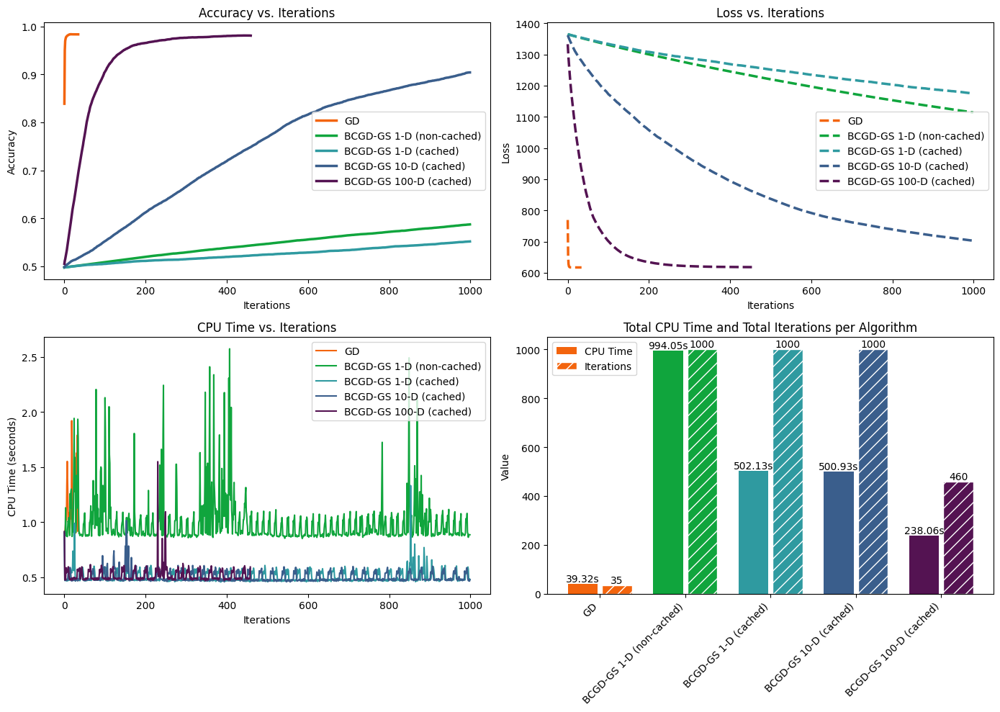

In [258]:
ut.plot_algorithm_comparison(results)